Loading datasets and pretrained models from AWS S3 Buckets

In [ ]:
import pandas as pd
import seaborn as sns
sns.set_style("dark")
import numpy as np
import matplotlib.pyplot as plt
train_df = pd.read_csv("../data/train_df.csv" , index_col = 0)
test_df = pd.read_csv("../data/test_df.csv" , index_col = 0)
X_train = train_df.drop(["dh_diff" , "ae_diff"] , axis = 1)
desc = X_train.columns
 
y_train = train_df[["dh_diff" , "ae_diff"]]
X_test = test_df.drop(["dh_diff" , "ae_diff"] , axis = 1)
y_test = test_df[["dh_diff" , "ae_diff"]]
smi_df = pd.read_csv("../data/smiles_db.csv" , index_col = 0)
targets = y_train.columns

In [ ]:
for x in X_train.columns:
  print(x)

MaxEStateIndex
MinEStateIndex
MaxAbsEStateIndex
MinAbsEStateIndex
qed
NumValenceElectrons
FpDensityMorgan1
FpDensityMorgan2
FpDensityMorgan3
BalabanJ
BertzCT
Chi0
Chi0n
Chi0v
Chi1
Chi1n
Chi1v
Chi2n
Chi2v
Chi3n
Chi3v
Chi4n
Chi4v
HallKierAlpha
Ipc
Kappa1
Kappa2
Kappa3
LabuteASA
PEOE_VSA1
PEOE_VSA10
PEOE_VSA11
PEOE_VSA12
PEOE_VSA13
PEOE_VSA14
PEOE_VSA2
PEOE_VSA3
PEOE_VSA4
PEOE_VSA5
PEOE_VSA6
PEOE_VSA7
PEOE_VSA8
PEOE_VSA9
SMR_VSA1
SMR_VSA10
SMR_VSA2
SMR_VSA3
SMR_VSA4
SMR_VSA5
SMR_VSA6
SMR_VSA7
SMR_VSA9
SlogP_VSA1
SlogP_VSA10
SlogP_VSA11
SlogP_VSA2
SlogP_VSA3
SlogP_VSA4
SlogP_VSA5
SlogP_VSA6
SlogP_VSA7
SlogP_VSA8
TPSA
EState_VSA1
EState_VSA10
EState_VSA2
EState_VSA3
EState_VSA4
EState_VSA5
EState_VSA6
EState_VSA7
EState_VSA8
EState_VSA9
VSA_EState1
VSA_EState2
VSA_EState3
VSA_EState4
VSA_EState5
VSA_EState6
VSA_EState7
VSA_EState8
VSA_EState9
FractionCSP3
NHOHCount
NumAliphaticCarbocycles
NumAliphaticHeterocycles
NumAliphaticRings
NumAromaticHeterocycles
NumAromaticRings
NumHAcceptors
NumHD

In [ ]:
#Get descriptive statistics on the training set
train_df.describe()

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,NumValenceElectrons,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,BalabanJ,BertzCT,Chi0,Chi0n,Chi0v,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3n,Chi3v,Chi4n,Chi4v,HallKierAlpha,Ipc,Kappa1,Kappa2,Kappa3,LabuteASA,PEOE_VSA1,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,PEOE_VSA14,PEOE_VSA2,PEOE_VSA3,PEOE_VSA4,PEOE_VSA5,PEOE_VSA6,...,ch_b,cc_b,cn_b,co_b,no_b,nh_b,nn_b,oh_b,oo_b,hh_b,n_H,n_C,n_O,n_N,ZPE_R,ZPE_P,ZPE_TS,ZPE_TS_R,ZPE_TS_P,ZPE_P_R,Dn_TS_R,Dn_TS_P,Dn_P_R,De_TS_R,De_TS_P,De_P_R,piS_TS_R,piS_TS_P,piS_P_R,Mul_TS_R,Mul_TS_P,Mul_P_R,Par_n_Pople_TS_R,Par_n_Pople_TS_P,Par_n_Pople_P_R,dh_diff,DH_Mopac,ae_diff,AE_mopac,exp_mopac
count,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,...,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.0,7098.0,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7098.000000,7.098000e+03
mean,-0.221603,0.088623,-0.221603,0.048235,-0.048421,-0.000141,0.114781,0.040814,0.035780,-0.775441,-5.676200,0.318592,0.137918,-0.067069,0.079004,-0.118498,-0.220374,-0.364663,-0.364663,-0.322220,-0.322220,-0.211258,-0.211258,-0.103163,-0.111039,0.899979,153.273781,941.113190,0.574813,0.345141,0.492281,0.192392,0.161774,0.181224,0.509929,-0.567914,0.520439,-0.110185,0.564347,1.460378,...,0.633841,0.560158,0.103973,0.195266,0.005354,0.070442,0.006622,0.082558,0.0,0.0,7.344322,4.452944,1.114821,0.790645,66.520395,64.535405,63.286076,-3.234319,-1.249329,-1.984990,-0.028828,0.029592,-0.058421,-0.034615,0.033328,-0.067944,-0.003223,0.003219,-0.006442,0.016078,-0.010486,0.026564,-0.614354,0.314963,-0.614354,12.982916,22.278235,80.405913,77.389489,3.300588e-08
std,1.883009,0.569441,1.883009,0.436675,0.087048,0.011869,0.309353,0.449129,0.499909,1.309377,22.728170,0.747079,0.627628,0.226838,0.363839,0.390776,0.261258,0.476105,0.476105,0.485158,0.485158,0.378518,0.378518,0.249871,27.739394,2.086458,9631.864278,17559.948522,0.866252,3.109582,4.839952,3.677081,2.976195,2.064414,2.788279,3.408751,2.585233,2.232597,3.745336,5.346627,...,0.606125,0.616207,0.324055,0.404874,0.072977,0.260817,0.081109,0.282808,0.0,0.0,2.426849,1.079924,0.766112,0.928082,16.772331,16.309128,16.575923,1.014609,1.761072,2.065074,0.108922,0.118591,0.155633,0.107987,0.113488,0.149107,0.027203,0.028659,0.039250,0.419116,0.433273,0.602533,0.671314,0.580465,0.671314,15.214829,27.507610,22.056029,21.628702,2.262073e-06
min,-7.174213,-1.568009,-7.174213,-1.568009,-0.381140,-1.000000,-1.166667,-2.000000,-2.500000,-4.001964,-131.602415,-1.577350,-2.000000,-1.292893,-0.931852,-1.478498,-1.316497,-2.356244,-2.356244,-2.654701,-2.654701,-2.794180,-2.794180,-0.840000,-134.622392,-6.596135,-23.247453,-9504.290000,-2.338367,-11.467335,-24.415866,-18.790788,-12.820191,-12.379401,-12.121780,-15.513634,-14.991901,-15.410749,-24.687568,-36.398202,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,1.000000,0.000000,0.000000,11.262000,10.491000,8.258000,-8.593000,-14.518000,-40.065000,-0.773742,-0.819575,-0.857377,-0.659486,-1.059207,-0.825246,-0.259655,-0.318258,-0.401827,-1.943293,-3.204958,-2.061578,-4.077208,-2.289309,-4.077208,-71.961643,-77.943240,13.468784,8.598350,1.701081e-93
25%,-0.866898,-0.238333,-0.8

# Exploratory Data Analysis
Descriptive Statistics


In [ ]:
#Get descriptive statistics on the test set
test_df.describe()

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,NumValenceElectrons,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,BalabanJ,BertzCT,Chi0,Chi0n,Chi0v,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3n,Chi3v,Chi4n,Chi4v,HallKierAlpha,Ipc,Kappa1,Kappa2,Kappa3,LabuteASA,PEOE_VSA1,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,PEOE_VSA14,PEOE_VSA2,PEOE_VSA3,PEOE_VSA4,PEOE_VSA5,PEOE_VSA6,...,ch_b,cc_b,cn_b,co_b,no_b,nh_b,nn_b,oh_b,oo_b,hh_b,n_H,n_C,n_O,n_N,ZPE_R,ZPE_P,ZPE_TS,ZPE_TS_R,ZPE_TS_P,ZPE_P_R,Dn_TS_R,Dn_TS_P,Dn_P_R,De_TS_R,De_TS_P,De_P_R,piS_TS_R,piS_TS_P,piS_P_R,Mul_TS_R,Mul_TS_P,Mul_P_R,Par_n_Pople_TS_R,Par_n_Pople_TS_P,Par_n_Pople_P_R,dh_diff,DH_Mopac,ae_diff,AE_mopac,exp_mopac
count,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,...,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.0,1253.0,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1253.000000,1.253000e+03
mean,-0.158572,0.082348,-0.158572,0.054453,-0.049348,-0.001596,0.109075,0.040132,0.036719,-0.763936,-6.398042,0.331884,0.163761,-0.050126,0.086774,-0.103950,-0.210219,-0.360803,-0.360803,-0.316113,-0.316113,-0.209094,-0.209094,-0.102314,0.515146,0.904389,15.128200,491.959813,0.587892,0.284104,0.521602,0.089155,0.339574,0.115526,0.467702,-0.539383,0.670149,-0.094423,0.612877,1.625406,...,0.617717,0.545890,0.093376,0.201117,0.006385,0.084597,0.008779,0.090982,0.0,0.0,7.379888,4.455706,1.120511,0.811652,66.876139,64.889945,63.636864,-3.239275,-1.253081,-1.986194,-0.024770,0.025827,-0.050597,-0.039829,0.030603,-0.070432,-0.003991,0.001885,-0.005876,0.041150,-0.007772,0.048922,-0.580677,0.278476,-0.580677,12.957715,21.719618,80.606925,77.340354,1.780805e-09
std,1.855962,0.544941,1.855962,0.420438,0.083854,0.039936,0.312990,0.456077,0.507261,1.278962,22.846677,0.752203,0.611766,0.194126,0.360310,0.383422,0.258751,0.484846,0.484846,0.473066,0.473066,0.369672,0.369672,0.258228,26.524311,2.167097,222.017604,12867.255970,0.837140,3.219152,4.826897,3.623882,3.021390,2.143839,2.615724,3.457387,2.666814,2.412596,3.808936,5.289926,...,0.592745,0.610486,0.307098,0.408885,0.079680,0.284072,0.093321,0.293198,0.0,0.0,2.421148,1.097773,0.785656,0.960710,16.720978,16.245207,16.520098,0.980572,1.726609,2.067600,0.110216,0.107859,0.150002,0.111839,0.104324,0.144748,0.028783,0.026125,0.038677,0.419132,0.417622,0.591134,0.661188,0.518753,0.661188,15.372278,26.710959,22.107081,21.313608,6.237749e-08
min,-6.641806,-2.031296,-6.641806,-1.564815,-0.336183,-1.000000,-1.000000,-1.666667,-1.833333,-3.816894,-129.695773,-2.000000,-2.000000,-1.292893,-0.893847,-1.288675,-1.288675,-2.500000,-2.500000,-2.181347,-2.181347,-2.291667,-2.291667,-0.870000,-101.125384,-3.172026,-20.847056,-1119.704444,-1.658155,-10.633577,-17.808984,-18.790788,-12.820191,-12.379401,-6.093240,-14.991383,-9.967957,-15.410749,-20.394727,-25.683286,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,1.000000,0.000000,0.000000,18.497000,17.109000,14.539000,-7.514000,-12.214000,-16.225000,-0.581334,-0.512950,-0.618197,-0.602484,-0.336813,-0.602484,-0.151152,-0.089468,-0.151152,-1.471026,-1.904459,-1.710397,-2.968642,-1.120066,-2.968642,-38.560554,-64.609630,24.774523,13.023460,3.065906e-89
25%,-0.752083,-0.240741,-0.7520

**Correlation among Descriptors**

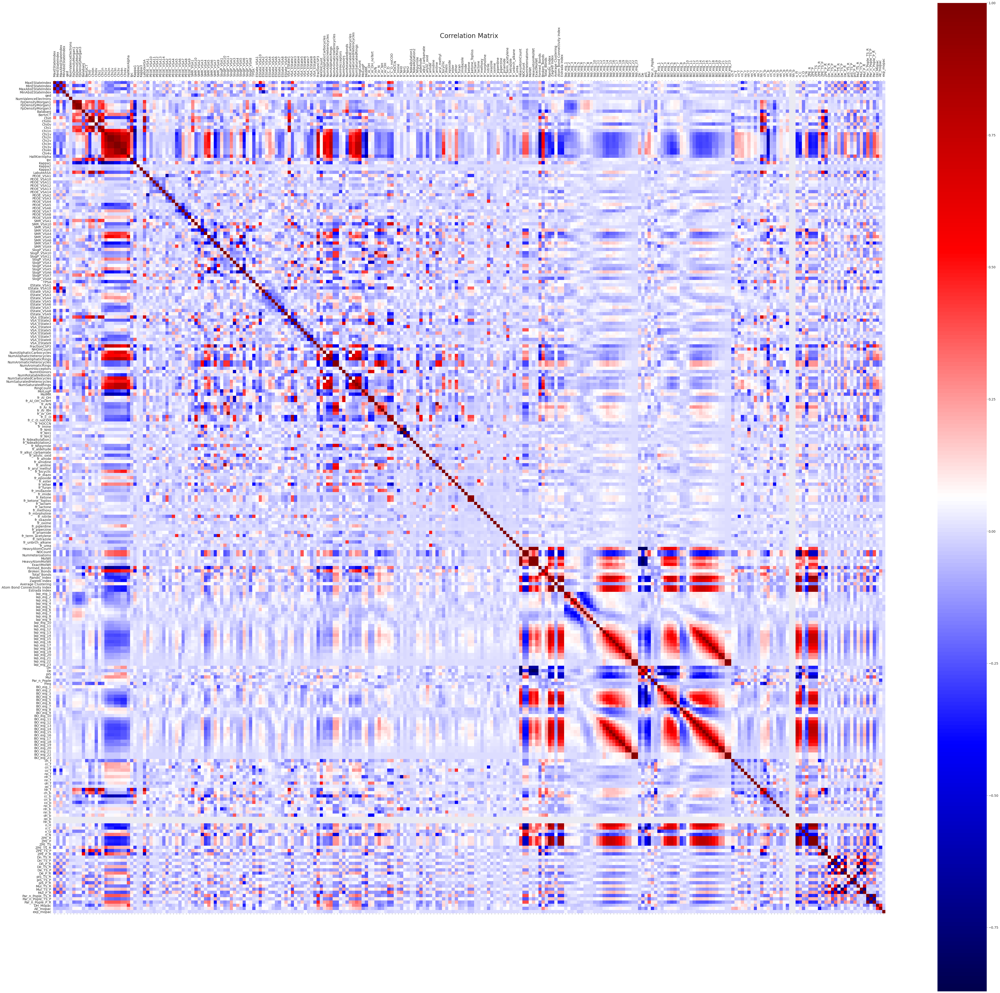

In [ ]:
#Calculate pairwise correlation among descriptors
corr = X_train.corr()

# Draw the heatmap with the mask and correct aspect ratio
f = plt.figure(figsize=(80, 76))
plt.matshow(corr, fignum=f.number , cmap = plt.cm.seismic)
plt.xticks(range(X_train.select_dtypes(['number']).shape[1]), X_train.select_dtypes(['number']).columns, fontsize=14, rotation=90)
plt.yticks(range(X_train.select_dtypes(['number']).shape[1]), X_train.select_dtypes(['number']).columns, fontsize=14)
plt.tick_params(axis='x', pad=15)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=28)
plt.savefig("correlation_matrix.pdf")


**Descriptors Visualizations**

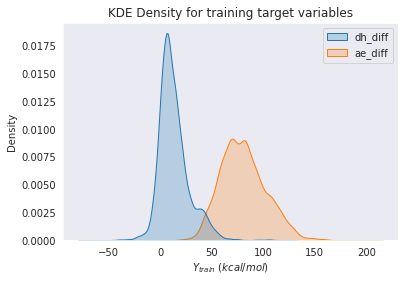

In [ ]:
#Plot probability density of target variables for training set
sns.kdeplot(shade = True , data = y_train)
plt.title("KDE Density for training target variables")
plt.xlabel("$Y_{train}$ $(kcal/mol)$")
plt.savefig("kdetarget_train.pdf")

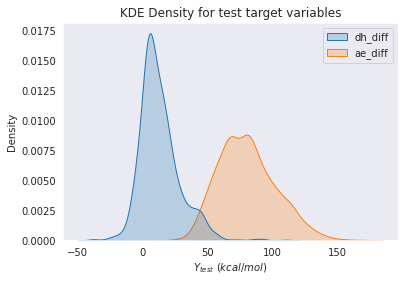

In [ ]:
#Plot probability density of target variables for test set
sns.kdeplot(shade = True , data = y_test)
plt.title("KDE Density for test target variables")
plt.xlabel("$Y_{test}$ $(kcal/mol)$")
plt.savefig("kdetarget_test.pdf")

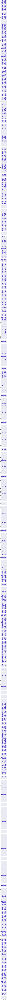

In [ ]:
#Plot pairwise relationships among target variables en descriptors
sns.pairplot(train_df , y_vars = desc.values , x_vars = targets.values , plot_kws={"color":"xkcd:blue with a hint of purple"})
plt.savefig("desc_vs_targets.pdf")

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


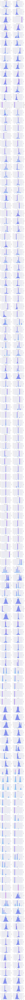

In [ ]:
k = len(X_train.columns)-1
n = 2
m = (k - 1) // n + 1
fig, axes = plt.subplots(m, n, figsize=(n * 5, m * 3))
for i, (name, col) in enumerate(X_train.iteritems()):
  if i!=(k):
    r, c = i // n, i % n
    ax = axes[r, c]
    col.hist(ax=ax , color = "darkviolet" , alpha = 0.5,bins=15)
    ax2 = ax.twinx()
    sns.kdeplot(ax=ax2, data = col  , color = "deepskyblue"  , shade = True, alpha = 0.3)
    ax2.title.set_text(name)
    ax2.set_ylim(0)

fig.tight_layout()
plt.savefig("descriptors_distribution.pdf")

In [ ]:
def RemoveCorr(df , threshold):

        corr_matrix = df.corr().abs()
        upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
        to_drop = [column for column in upper.columns if any(upper[column] > threshold)]
        print("Dropping " ,to_drop ,"Because of corr>" , threshold)
        df = df.drop(to_drop,axis=1,inplace = False)
        return df

#Remove highly correlated features using 0.9 as threshold for removal 

X_train = RemoveCorr(X_train , 0.9)

Dropping  ['MaxAbsEStateIndex', 'FpDensityMorgan3', 'Chi1', 'Chi2v', 'Chi3n', 'Chi3v', 'Chi4v', 'NumAromaticRings', 'RingCount', 'fr_Al_OH_noTert', 'fr_Ar_OH', 'fr_Nhpyrrole', 'fr_aniline', 'fr_ketone_Topliss', 'NumHeteroatoms', 'MolWt', 'HeavyAtomMolWt', 'ExactMolWt', 'Atom Bond Connectivity Index', 'Estrada Index', 'lap_eig_23', 'piS', 'BO_eig_14', 'BO_eig_15', 'BO_eig_16', 'BO_eig_17', 'BO_eig_18', 'BO_eig_19', 'BO_eig_20', 'BO_eig_21', 'BO_eig_22', 'BO_eig_23', 'n_H', 'ZPE_R', 'ZPE_P', 'ZPE_TS', 'Par_n_Pople_P_R'] Because of corr> 0.9


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  after removing the cwd from sys.path.


In [ ]:
X_train.columns.values[132]

'NOCount'

In [ ]:
#Drop correlated descriptors in the test set as well
X_test = X_test.drop(['MaxAbsEStateIndex', 'FpDensityMorgan3', 'Chi1', 'Chi2v', 'Chi3n', 'Chi3v', 'Chi4v', 'NumAromaticRings', 
                      'RingCount', 'fr_Al_OH_noTert', 'fr_Ar_OH', 'fr_Nhpyrrole', 'fr_aniline', 'fr_ketone_Topliss', 'NumHeteroatoms', 'MolWt', 'HeavyAtomMolWt', 'ExactMolWt', 
                      'Atom Bond Connectivity Index', 'Estrada Index', 'lap_eig_23', 'piS', 'BO_eig_14', 'BO_eig_15', 'BO_eig_16', 'BO_eig_17', 'BO_eig_18', 'BO_eig_19', 'BO_eig_20', 
                      'BO_eig_21', 'BO_eig_22', 'BO_eig_23', 'n_H', 'ZPE_R', 'ZPE_P', 'ZPE_TS', 'Par_n_Pople_P_R'] , axis = 1)

# Models
**DL-based approach and hyperparameter optimization**

In [ ]:
from sklearn.model_selection import GridSearchCV
from keras.wrappers.scikit_learn import KerasRegressor
from keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

def get_hyper_model(num_hidden_layers , num_neurons_per_layer):


        model = Sequential()
        model.add(layers.Dense(128 , input_shape = (222, ) , activation = "relu"))
        for i in range(1,num_hidden_layers):
                model.add(layers.Dense(2**(10-i-num_neurons_per_layer) , activation = "relu"))
        model.add(layers.Dense(64 , activation = "sigmoid"))
        model.add(layers.Dense(32 , activation = "relu"))
        model.add(layers.Dense(2 , activation = "linear"))
        opt = Adam(learning_rate = 0.001)
        model.compile(loss = "mae" , optimizer = opt , metrics = ["mae" , "mse"])
        return model


/usr/local/lib/python3.7/dist-packages/requests/__init__.py:91: RequestsDependencyWarning: urllib3 (1.26.10) or chardet (3.0.4) doesn't match a supported version!
  RequestsDependencyWarning)


In [ ]:
#Optimize network architecture using grid search to test different combinations
#of hidden layers and number of neurons per hidden layers

model = KerasRegressor(build_fn = get_hyper_model , batch_size = 128 , verbose = True)


params = {"num_hidden_layers":[2,3,4] , "num_neurons_per_layer":[1,2,3]}

grid = GridSearchCV(estimator = model , param_grid = params , n_jobs = 15 , cv=5)

grid_result = grid.fit(X_train, y_train  , epochs = 2000 , batch_size = 512)


print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
        print("%f (%f) with: %r" % (mean, stdev, param))
print("FINAL RESULTS -> " , grid_result.cv_results_)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/joblib/externals/loky/process_executor.py:705: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


In [ ]:
def get_new_model(lr , batch_size , do_r):

        model = Sequential()
        model.add(layers.Dense(128 , input_shape = (222, ) , activation = "relu"))
        model.add(layers.Dropout(do_r))
        model.add(layers.Dense(256 , activation = "relu"))
        model.add(layers.Dropout(do_r))
        model.add(layers.Dense(64 , activation = "sigmoid"))
        model.add(layers.Dropout(do_r))
        model.add(layers.Dense(32 , activation = "relu"))
        model.add(layers.Dense(2 , activation = "linear"))
        opt = Adam(learning_rate = lr)
        model.compile(loss = "mae" , optimizer = opt , metrics = ["mae" , "mse"])

        return model


In [ ]:
#Optimize batch size , learning rate and dropout rate hyperparameters using a grid search again
model = KerasRegressor(build_fn = get_new_model , verbose = True)

params = {"batch_size" :[128 , 256 , 512] , "lr":[0.01,0.001,0.0001] , "do_r":[0.15, 0.25 , 0.35]}

grid = GridSearchCV(estimator = model , param_grid = params , n_jobs = -1 , cv=5)

grid_result = grid.fit(X_train,y_train , epochs = 500)


print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
        print("%f (%f) with: %r" % (mean, stdev, param))


print(grid_result.cv_results_)



In [ ]:
def final_model():

        model = Sequential()
        model.add(layers.Dense(128 , input_shape = (222, ) , activation = "relu"))
        model.add(layers.Dropout(0.15))
        model.add(layers.Dense(256 , activation = "relu"))
        model.add(layers.Dropout(0.15))
        model.add(layers.Dense(64 , activation = "sigmoid"))
        model.add(layers.Dropout(0.15))
       	model.add(layers.Dense(32 , activation = "relu"))
        model.add(layers.Dense(2 , activation = "linear"))
        opt = Adam(learning_rate = 0.001)
        model.compile(loss = "mae" , optimizer = opt , metrics = ["mae" , "mse"])

        return model


In [ ]:
model = final_model()
model.fit(X_train , y_train.values , epochs = 2**12, batch_size = 512 , validation_data = (X_test, y_test.values) , verbose=True)
model.save("ann_final_model.h5")
#From training this model we conclude that early stopping can be applied, but it becomes clearer after checking the evolution of learning curves 
#Keep in mind that model MAE refers to both activation energy and product-reactants differences

In [ ]:
#Store predictions from this model 
y_preds = model.predict(X_test)
print(y_preds)

In [ ]:
print(np.std(np.abs(y_preds - y_test)))

# Results from NN predictions

In [ ]:
from sklearn.metrics import mean_absolute_error
import seaborn as sns
sns.set_style("white")
def PlotCorr(ae_dft , ae_mopac , ae_corr):
        sns.set_style("darkgrid")
        fig , (ax1 , ax2)  = plt.subplots(1,2 , figsize= (8,6))
        mae = mean_absolute_error(ae_dft, ae_corr)
        mae_or = mean_absolute_error(ae_dft , ae_mopac)
        fig.suptitle("DFT vs PM7 comparison + DL correction")
        ax1.plot(ae_mopac , ae_dft , "o" , color = "deeppink" , alpha=0.7)
        ax1.plot([np.min(ae_mopac),np.max(ae_mopac)] , [np.min(ae_dft) , np.max(ae_dft)] , "-k" , linewidth=4)
        ax1.set_xlabel("$E_{a}^{PM7}$ $(kcal/mol)$")
        ax1.set_ylabel("$E_{a}^{DFT}$ $(kcal/mol)$")
        ax1.text(30,165, "MAE= %.2f $(kcal/mol)$" %mae_or ,style='italic',
        bbox={'facecolor': 'gold', 'alpha': 0.5, 'pad': 10})
        ax2.plot(ae_corr , ae_dft , "o" , color = "deepskyblue" , alpha=0.7)
        ax2.plot([np.min(ae_corr),np.max(ae_corr)] , [np.min(ae_dft) , np.max(ae_dft)] , "-k" , linewidth=4)
        ax2.set_xlabel("$E_{a}^{PM7+DL}$ $(kcal/mol)$")
        ax2.text(40,165, "MAE= %.2f $(kcal/mol)$" %mae ,style='italic',
        bbox={'facecolor': 'gold', 'alpha': 0.5, 'pad': 10})
        plt.savefig("ea_preds_nn.pdf")
        return


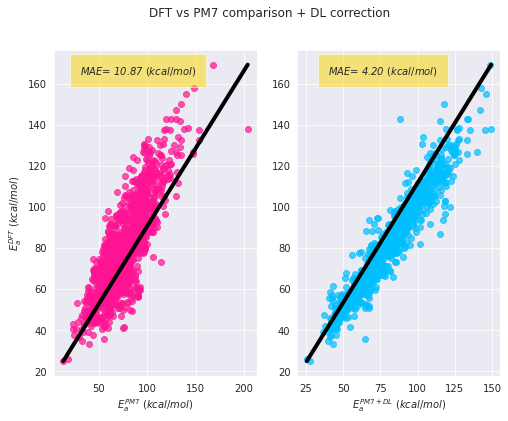

In [ ]:
PlotCorr(y_test["ae_diff"].values , X_test["AE_mopac"].values , y_preds[:,1])

In [ ]:
!pip install mpl_scatter_density
import mpl_scatter_density

def DensPlot(ae_dft , ae_mopac , ae_corr):
        fig = plt.figure(figsize = (8,6))
        ax = fig.add_subplot(1, 1, 1, projection='scatter_density' )
        ax.grid(False)
        density = ax.scatter_density(ae_corr, ae_dft , cmap=plt.cm.viridis )
        ax.set_xlabel("$E_{a}^{PM7+DL}$ $(kcal/mol)$")
        ax.set_ylabel("$E_{a}^{DFT}$ $(kcal/mol)$")
        fig.colorbar(density, label='Count')
        plt.savefig("dens_nn.pdf")
        return

All-NaN slice encountered
All-NaN slice encountered


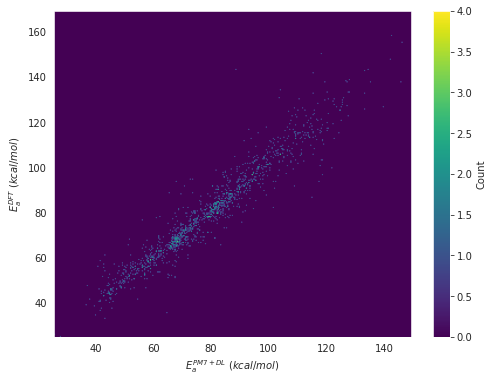

In [ ]:
DensPlot(y_test["ae_diff"].values, X_test["AE_mopac"].values , y_preds[:,1])

In [ ]:
#!pip uninstall bayesian-optimization -y
#!pip install bayesian-optimization==0.6.0
import xgboost as xg
#from bayes_opt import BayesianOptimization
from functools import partial
from sklearn.model_selection import KFold
from sklearn.metrics import mean_absolute_error
#from tqdm import tqdm, tqdm_notebook
y_train_xg = y_train["ae_diff"]
y_test_xg = y_test["ae_diff"]

In [ ]:
CROSS_VALIDATION_PARAMS = dict(n_splits=5, shuffle=True, random_state=43)

XGBOOST_REGRESSOR_PARAMS = dict(
    learning_rate=0.01, n_estimators=100, subsample=0.8, colsample_bytree=0.8, 
    max_depth=10, booster = "dart" ,n_jobs=-1 , num_boost_rounds = 1000
)

BAYESIAN_OPTIMIZATION_MAXIMIZE_PARAMS = dict(
    init_points=2,  # init_points=20,
    n_iter=100,  # n_iter=60,
    acq='poi', xi=0.0
)
BAYESIAN_OPTIMIZATION_BOUNDARIES = dict(
    max_depth=(5, 15.00),
    gamma=(0.01, 5),
    min_child_weight=(0, 9),
    scale_pos_weight=(1.2, 5),
    reg_alpha=(4.0, 10.0),
    reg_lambda=(1.0, 10.0),
    max_delta_step=(0, 5),
    subsample=(0.5, 1.0),
    eta = (0.001 , 0.5),
    colsample_bytree=(0.3, 1.0),
    learning_rate=(0.0, 0.25),
    num_boost_rounds = (1000 , 1000)
)
BAYESIAN_OPTIMIZATION_INITIAL_SEARCH_POINTS = dict(
    max_depth=[5, 15],
    eta = [0.0001 , 0.5],
    gamma=[0.1511, 3.8463],
    min_child_weight=[2.4073, 4.9954],
    scale_pos_weight=[2.2281, 4.0345],
    reg_alpha=[8.0702, 9.0573],
    reg_lambda=[2.0126, 3.5934],
    max_delta_step=[1, 2],
    subsample=[0.8, 0.8234],
    colsample_bytree=[0.8, 0.7903],
    learning_rate=[0.1, 0.001],
    num_boost_rounds = [1000,1000]
)

BASE_ESTIMATOR = partial(xg.XGBRegressor)

In [ ]:
def search_node(**kwargs):
    # global train_df, test_df, train_input, oof, test_predictions, best_round, target
    global X_train , y_train_xg

    ###############################################
    # Unify Parameters
    ###############################################
    received_params = dict(dict(
        n_estimators=200,
    ), **{_k: _v if _k not in ('max_depth') else int(_v) for _k, _v in kwargs.items()})
    
    current_params = dict(XGBOOST_REGRESSOR_PARAMS, **received_params)

    ###############################################
    # Initialize Folds and Result Placeholders
    ###############################################
    folds = KFold(**CROSS_VALIDATION_PARAMS)
    evaluation = np.zeros((current_params['n_estimators'], CROSS_VALIDATION_PARAMS['n_splits']))
    oof_predictions = np.empty(len(X_train))
    np.random.seed(32)

    progress_bar = tqdm_notebook(
        enumerate(folds.split(y_train_xg, y_train_xg)), 
        total=CROSS_VALIDATION_PARAMS['n_splits'], 
        leave=False
    )
    
    ###############################################
    # Begin Cross-Validation
    ###############################################
    for fold, (train_index, validation_index) in progress_bar:
        train_input, validation_input = X_train.iloc[train_index], X_train.iloc[validation_index]
        train_target, validation_target = y_train_xg.iloc[train_index], y_train_xg.iloc[validation_index]

        ###############################################
        # Initialize and Fit Model With Current Parameters
        ###############################################
        model = BASE_ESTIMATOR(**current_params)
        eval_set = [(train_input, train_target), (validation_input, validation_target)]
        model.fit(train_input, train_target, eval_set=eval_set, verbose=False )

        ###############################################
        # Find Best Round for Validation Set
        ###############################################
        evaluation[:, fold] = model.evals_result_["validation_1"]['rmse']
        best_round = np.argsort(evaluation[:, fold])[0]

        progress_bar.set_description('Fold #{}:   {:.5f}'.format(
            fold, evaluation[:, fold][best_round]
        ), refresh=True)

    ###############################################
    # Compute Mean and Standard Deviation of RMSLE
    ###############################################
    mean_eval, std_eval = np.mean(evaluation, axis=1), np.std(evaluation, axis=1)
    best_round = np.argsort(mean_eval)[0]
    search_value = mean_eval[best_round]

    ###############################################
    # Update Best Score and Return Negative Value
    # In order to minimize error, instead of maximizing accuracy
    ###############################################
    print(' Stopped After {} Epochs... Validation RMSLE: {:.6f} +- {:.6f}'.format(
        best_round, search_value, std_eval[best_round]
    ))

    return -search_value

In [ ]:
import warnings 

bayes_opt = BayesianOptimization(search_node, BAYESIAN_OPTIMIZATION_BOUNDARIES)
bayes_opt.explore(BAYESIAN_OPTIMIZATION_INITIAL_SEARCH_POINTS)

with warnings.catch_warnings():
    warnings.filterwarnings('ignore')
    bayes_opt.maximize(**BAYESIAN_OPTIMIZATION_MAXIMIZE_PARAMS)

Initialization
---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
 Step |   Time |      Value |   colsample_bytree |       eta |     gamma |   learning_rate |   max_delta_step |   max_depth |   min_child_weight |   num_boost_rounds |   reg_alpha |   reg_lambda |   scale_pos_weight |   subsample | 


[20:12:32] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:12:37] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:12:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:12:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:12:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 63.836507 +- 0.117162
    1 | 00m24s |  -63.83651 |             0.8000 |    0.0001 |    0.1511 |          0.1000 |           1.0000 |      5.0000 |             2.4073 |          1000.0000 |      8.0702 |       2.0126 |             2.2281 |      0.8000 | 


[20:12:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:13:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:13:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:13:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:13:16] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 82.507996 +- 0.139022
    2 | 00m24s |  -82.50800 |             0.7903 |    0.5000 |    3.8463 |          0.0010 |           2.0000 |     15.0000 |             4.9954 |          1000.0000 |      9.0573 |       3.5934 |             4.0345 |      0.8234 | 


[20:13:21] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:13:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:13:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:13:36] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:13:41] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 46.693277 +- 0.093090
    3 | 00m24s |  -46.69328 |             0.6619 |    0.0282 |    1.7577 |          0.2480 |           0.7811 |     14.7420 |             6.2949 |          1000.0000 |      7.2664 |       8.0616 |             1.3986 |      0.7988 | 


[20:13:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:13:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:13:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:14:00] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:14:05] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 82.753056 +- 0.139267
    4 | 00m24s |  -82.75306 |             0.7632 |    0.0086 |    1.3031 |          0.0002 |           3.5323 |      5.6387 |             5.8403 |          1000.0000 |      6.3833 |       9.6374 |             3.5638 |      0.9824 | 
Bayesian Optimization
-----------------------------------------

[20:14:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:14:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:15:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:15:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:16:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 6.026210 +- 0.185585
    5 | 02m50s |   -6.02621 |             0.6787 |    0.1706 |    0.0100 |          0.2500 |           4.1739 |     15.0000 |             9.0000 |          1000.0000 |      4.2325 |       8.0730 |             2.1753 |      0.9716 | 


[20:17:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:17:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:18:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:18:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:19:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 5.945237 +- 0.189874
    6 | 02m30s |   -5.94524 |             0.8968 |    0.2502 |    0.3167 |          0.1939 |           4.3411 |     14.9506 |             8.5331 |          1000.0000 |      4.0426 |       9.1762 |             4.1042 |      0.6003 | 


[20:19:32] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:19:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:19:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:20:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:20:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 18.165608 +- 0.191868
    7 | 00m53s |  -18.16561 |             0.6800 |    0.2636 |    1.4178 |          0.0960 |           4.0823 |     14.1011 |             8.8413 |          1000.0000 |      4.1705 |       9.9966 |             1.9919 |      0.7791 | 


[20:20:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:20:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:20:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:20:38] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:20:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 47.966606 +- 0.094317
    8 | 00m21s |  -47.96661 |             0.4244 |    0.4687 |    0.0319 |          0.0425 |           4.3914 |     14.5815 |             8.7920 |          1000.0000 |      4.1622 |       6.0476 |             3.8666 |      0.8079 | 


[20:20:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:20:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:20:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:21:02] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:21:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 30.187016 +- 0.123723
    9 | 00m25s |  -30.18702 |             0.3537 |    0.0290 |    0.0997 |          0.0835 |           3.5365 |     14.7457 |             7.5357 |          1000.0000 |      4.7916 |       9.8238 |             3.2615 |      0.8656 | 


[20:21:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:21:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:22:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:22:58] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:23:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 7.516857 +- 0.296113
   10 | 02m56s |   -7.51686 |             0.9069 |    0.3410 |    4.6614 |          0.1363 |           4.2882 |     13.8999 |             0.1131 |          1000.0000 |      4.3102 |       9.8862 |             2.5178 |      0.8582 | 


[20:24:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:24:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:24:21] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:24:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:24:32] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 57.046762 +- 0.107473
   11 | 00m29s |  -57.04676 |             0.6716 |    0.2658 |    4.9838 |          0.0818 |           1.6686 |     14.0080 |             0.2599 |          1000.0000 |      4.2700 |       9.9099 |             3.3676 |      0.8305 | 


[20:24:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:24:59] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:25:16] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:25:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:25:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 6.098502 +- 0.132923
   12 | 01m30s |   -6.09850 |             0.9655 |    0.3888 |    4.6046 |          0.2332 |           4.8020 |      5.1655 |             8.9816 |          1000.0000 |      9.7317 |       1.4159 |             2.8595 |      0.7422 | 


[20:26:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:26:18] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:26:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:26:29] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:26:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 78.816699 +- 0.135376
   13 | 00m31s |  -78.81670 |             0.9914 |    0.1158 |    4.8855 |          0.1377 |           0.1538 |      7.2915 |             8.5768 |          1000.0000 |      4.5597 |       1.5882 |             4.7371 |      0.7656 | 


[20:26:41] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:27:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:27:36] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:28:05] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:28:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 14.469766 +- 0.252962
   14 | 02m22s |  -14.46977 |             0.9564 |    0.2011 |    3.5066 |          0.0933 |           4.6403 |     13.0592 |             0.0509 |          1000.0000 |      4.5618 |       9.6626 |             1.6621 |      0.7999 | 


[20:29:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:29:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:29:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:29:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:29:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 21.941494 +- 0.184245
   15 | 00m41s |  -21.94149 |             0.3110 |    0.3540 |    4.8290 |          0.0751 |           4.7806 |     13.9727 |             1.4364 |          1000.0000 |      4.3488 |       9.5156 |             1.5861 |      0.8960 | 


[20:29:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:30:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:31:09] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:31:52] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:32:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 6.129085 +- 0.191326
   16 | 03m34s |   -6.12909 |             0.8586 |    0.3997 |    4.2747 |          0.2174 |           4.7569 |     13.5638 |             0.0352 |          1000.0000 |      4.4483 |       9.7336 |             2.3814 |      0.7302 | 


[20:33:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:33:36] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:33:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:34:09] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:34:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 6.267456 +- 0.131117
   17 | 01m25s |   -6.26746 |             0.9697 |    0.4992 |    4.3889 |          0.2214 |           4.1824 |      5.0665 |             7.2540 |          1000.0000 |      9.9089 |       1.0098 |             1.6156 |      0.9193 | 


[20:34:44] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:34:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:35:02] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:35:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:35:20] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 17.421195 +- 0.204522
   18 | 00m45s |  -17.42120 |             0.7432 |    0.1007 |    4.8070 |          0.0909 |           4.4068 |      5.6919 |             8.2933 |          1000.0000 |      9.7750 |       2.5864 |             1.7160 |      0.7231 | 


[20:35:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:35:36] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:35:41] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:35:47] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:35:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 44.936816 +- 0.092696
   19 | 00m30s |  -44.93682 |             0.8578 |    0.4914 |    4.0709 |          0.0410 |           4.9694 |      5.1678 |             8.8036 |          1000.0000 |      9.5655 |       1.3613 |             2.8550 |      0.6651 | 


[20:36:00] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:36:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:36:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:36:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:36:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 57.100602 +- 0.107215
   20 | 00m29s |  -57.10060 |             0.9004 |    0.4430 |    4.7131 |          0.0531 |           2.5651 |      8.8281 |             2.4175 |          1000.0000 |      9.9267 |       9.8389 |             2.6144 |      0.8975 | 


[20:36:29] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:36:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:36:38] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:36:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:36:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 78.985168 +- 0.135546
   21 | 00m22s |  -78.98517 |             0.5544 |    0.0119 |    0.3974 |          0.0479 |           0.4242 |     11.9693 |             6.2197 |          1000.0000 |      7.8628 |       2.8135 |             3.1760 |      0.5492 | 


[20:36:52] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:37:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:37:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:37:41] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:37:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 12.123064 +- 0.237977
   22 | 01m21s |  -12.12306 |             0.7837 |    0.2534 |    4.9553 |          0.1061 |           4.3656 |     10.6750 |             4.4812 |          1000.0000 |      6.7394 |       1.9710 |             4.0996 |      0.8986 | 


[20:38:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:38:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:38:25] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:38:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:38:37] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 56.871521 +- 0.106683
   23 | 00m29s |  -56.87152 |             0.9999 |    0.1563 |    0.5285 |          0.1102 |           1.2475 |     11.8853 |             4.3506 |          1000.0000 |      4.7661 |       5.6568 |             3.9597 |      0.9559 | 


[20:38:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:39:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:39:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:39:58] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:40:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 6.024951 +- 0.173346
   24 | 02m05s |   -6.02495 |             0.7718 |    0.1231 |    3.7252 |          0.2265 |           4.2042 |     11.9642 |             7.7670 |          1000.0000 |      7.9021 |       7.2263 |             1.3120 |      0.5171 | 


[20:40:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:40:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:40:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:41:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:41:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 50.796379 +- 0.097518
   25 | 00m21s |  -50.79638 |             0.4341 |    0.0150 |    4.1919 |          0.0546 |           3.1281 |     10.4707 |             8.1798 |          1000.0000 |      6.8549 |       7.1279 |             3.4647 |      0.6876 | 


[20:41:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:41:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:41:20] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:41:25] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:41:29] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 81.544437 +- 0.138105
   26 | 00m23s |  -81.54444 |             0.6351 |    0.4822 |    0.4565 |          0.0015 |           4.6538 |      6.2032 |             8.7141 |          1000.0000 |      6.7015 |       3.2866 |             2.0432 |      0.7983 | 


[20:41:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:41:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:42:05] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:42:20] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:42:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 7.822514 +- 0.195843
   27 | 01m15s |   -7.82251 |             0.3258 |    0.0847 |    1.7731 |          0.1436 |           4.1276 |     13.7858 |             2.5452 |          1000.0000 |      5.2072 |       3.6035 |             2.3535 |      0.6598 | 


[20:42:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:42:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:42:58] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:43:02] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:43:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 65.537344 +- 0.119516
   28 | 00m20s |  -65.53734 |             0.3986 |    0.2219 |    3.6280 |          0.1765 |           0.5152 |      5.3975 |             1.4812 |          1000.0000 |      4.2034 |       3.2594 |             4.6100 |      0.5950 | 


[20:43:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:43:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:43:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:43:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:43:36] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 36.075019 +- 0.100990
   29 | 00m31s |  -36.07502 |             0.6666 |    0.3699 |    1.5229 |          0.1583 |           1.6202 |      9.0895 |             2.5283 |          1000.0000 |      5.8458 |       1.2657 |             4.6677 |      0.5287 | 


[20:43:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:43:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:44:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:44:18] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:44:29] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 12.659757 +- 0.225715
   30 | 00m58s |  -12.65976 |             0.8983 |    0.0945 |    3.0541 |          0.2071 |           2.2195 |      5.1744 |             4.4510 |          1000.0000 |      5.5797 |       4.7723 |             2.2488 |      0.5903 | 


[20:44:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:44:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:44:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:44:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:44:58] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 70.961230 +- 0.126538
   31 | 00m22s |  -70.96123 |             0.4697 |    0.2937 |    0.4253 |          0.0663 |           0.9394 |     11.8883 |             1.4661 |          1000.0000 |      9.5198 |       6.1013 |             4.3425 |      0.8657 | 


[20:45:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:45:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:45:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:45:38] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:45:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 16.387790 +- 0.197393
   32 | 00m58s |  -16.38779 |             0.8071 |    0.4653 |    3.8796 |          0.0890 |           4.6064 |     12.7346 |             8.3813 |          1000.0000 |      8.8038 |       7.7660 |             1.2839 |      0.5523 | 


[20:46:02] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:46:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:47:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:47:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:47:59] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 6.613025 +- 0.174758
   33 | 02m27s |   -6.61302 |             0.3779 |    0.3858 |    2.1530 |          0.2353 |           4.9331 |     14.9789 |             1.7071 |          1000.0000 |      4.3220 |       2.2536 |             2.0366 |      0.9241 | 


[20:48:29] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:48:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:48:38] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:48:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:48:47] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 67.786369 +- 0.122531
   34 | 00m23s |  -67.78637 |             0.5873 |    0.4688 |    4.8736 |          0.0588 |           1.3451 |      5.3533 |             8.7102 |          1000.0000 |      9.9410 |       1.7824 |             1.3191 |      0.6698 | 


[20:48:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:48:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:49:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:49:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:49:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 82.455675 +- 0.138984
   35 | 00m23s |  -82.45567 |             0.5822 |    0.0482 |    0.1477 |          0.0319 |           0.0712 |      7.6122 |             2.8192 |          1000.0000 |      4.1401 |       9.2663 |             4.6025 |      0.5556 | 


[20:49:16] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:49:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:49:52] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:50:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:50:29] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 6.205309 +- 0.100972
   36 | 01m32s |   -6.20531 |             0.6383 |    0.2137 |    0.9097 |          0.2402 |           3.2232 |      8.2192 |             3.5246 |          1000.0000 |      9.5784 |       5.9617 |             3.2315 |      0.7937 | 


[20:50:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:50:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:50:59] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:51:05] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:51:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 72.898526 +- 0.128864
   37 | 00m28s |  -72.89853 |             0.9272 |    0.1076 |    3.9604 |          0.0356 |           1.4641 |     11.7075 |             1.1793 |          1000.0000 |      9.4588 |       4.4757 |             2.9118 |      0.9639 | 


[20:51:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:51:36] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:51:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:52:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:52:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 197 Epochs... Validation RMSLE: 5.988891 +- 0.211528
   38 | 01m37s |   -5.98889 |             0.5715 |    0.3069 |    0.8510 |          0.2500 |           4.9310 |      7.9110 |             2.9512 |          1000.0000 |      9.7974 |       5.6623 |             2.1869 |      0.6474 | 


[20:52:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:52:58] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:53:02] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:53:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:53:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 72.497688 +- 0.128391
   39 | 00m20s |  -72.49769 |             0.3421 |    0.2168 |    0.8987 |          0.0109 |           4.9772 |     13.8895 |             1.5940 |          1000.0000 |      4.5168 |       1.9983 |             1.2384 |      0.5761 | 


[20:53:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:53:20] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:53:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:53:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:53:37] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 26.090768 +- 0.158086
   40 | 00m29s |  -26.09077 |             0.3887 |    0.3818 |    4.8417 |          0.1328 |           2.4474 |     10.8955 |             6.9280 |          1000.0000 |      4.3942 |       3.2867 |             1.2607 |      0.7029 | 


[20:53:44] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:53:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:53:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:53:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:54:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 70.766690 +- 0.126317
   41 | 00m23s |  -70.76669 |             0.5573 |    0.4108 |    0.0235 |          0.0172 |           3.6718 |     13.5846 |             8.3302 |          1000.0000 |      9.3793 |       9.6239 |             2.7617 |      0.9526 | 


[20:54:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:54:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:54:18] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:54:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:54:28] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 79.336163 +- 0.135910
   42 | 00m27s |  -79.33616 |             0.8437 |    0.0730 |    3.6709 |          0.0056 |           3.2886 |     14.6044 |             1.9823 |          1000.0000 |      4.2861 |       2.5353 |             3.9055 |      0.9877 | 


[20:54:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:54:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:55:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:55:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:55:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 6.057950 +- 0.188868
   43 | 01m39s |   -6.05795 |             1.0000 |    0.5000 |    5.0000 |          0.2500 |           5.0000 |      5.0000 |             4.3052 |          1000.0000 |     10.0000 |       1.0000 |             1.2000 |      1.0000 | 


[20:56:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:56:18] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:56:21] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:56:25] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:56:29] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 70.447433 +- 0.125916
   44 | 00m20s |  -70.44743 |             0.3240 |    0.3084 |    3.3265 |          0.0147 |           4.4106 |      5.6904 |             4.9535 |          1000.0000 |      8.5597 |       2.8215 |             2.9341 |      0.8565 | 


[20:56:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:57:02] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:57:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:57:59] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:58:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 6.240080 +- 0.189137
   45 | 02m22s |   -6.24008 |             0.4844 |    0.2963 |    1.9766 |          0.2028 |           4.5752 |     14.3655 |             2.0500 |          1000.0000 |      4.9373 |       3.6374 |             2.1641 |      0.9041 | 


[20:58:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:59:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:59:29] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[20:59:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:00:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 7.921783 +- 0.195289
   46 | 01m21s |   -7.92178 |             0.3812 |    0.2236 |    2.2991 |          0.1194 |           4.8815 |     14.0035 |             2.2920 |          1000.0000 |      4.9091 |       4.7164 |             1.8762 |      0.5880 | 


[21:00:18] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:00:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:00:59] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:01:20] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:01:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 198 Epochs... Validation RMSLE: 5.969496 +- 0.195222
   47 | 01m44s |   -5.96950 |             0.6890 |    0.1946 |    0.0100 |          0.2500 |           4.7289 |      7.7537 |             3.3736 |          1000.0000 |     10.0000 |       6.4466 |             2.8889 |      0.7513 | 


[21:02:02] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:02:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:02:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:02:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:02:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 81.161529 +- 0.137720
   48 | 00m21s |  -81.16153 |             0.4440 |    0.1838 |    3.2446 |          0.0050 |           1.7968 |      5.1976 |             8.0209 |          1000.0000 |      9.0204 |       7.3922 |             2.4191 |      0.6050 | 


[21:02:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:02:47] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:03:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:03:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:03:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 6.111110 +- 0.192905
   49 | 01m56s |   -6.11111 |             0.5403 |    0.2304 |    3.0013 |          0.1984 |           4.3479 |     14.9838 |             7.4682 |          1000.0000 |      5.5307 |       2.4729 |             3.8764 |      0.5533 | 


[21:04:21] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:04:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:05:16] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:05:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:06:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 5.977861 +- 0.119285
   50 | 02m19s |   -5.97786 |             0.7087 |    0.0082 |    3.8961 |          0.1762 |           4.8087 |     14.7167 |             8.7116 |          1000.0000 |      5.0853 |       1.2040 |             3.1738 |      0.6712 | 


[21:06:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:06:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:06:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:06:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:07:00] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 76.572920 +- 0.133011
   51 | 00m25s |  -76.57292 |             0.7240 |    0.2928 |    3.1112 |          0.1145 |           0.2871 |      7.6530 |             5.6178 |          1000.0000 |      4.5486 |       9.4103 |             1.6842 |      0.9522 | 


[21:07:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:07:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:07:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:08:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:08:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 9.507937 +- 0.306361
   52 | 01m32s |   -9.50794 |             0.5751 |    0.3362 |    1.7361 |          0.1081 |           4.7310 |     14.9619 |             3.1655 |          1000.0000 |      4.0447 |       4.1077 |             1.7796 |      0.8866 | 


[21:08:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:09:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:09:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:09:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:10:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 197 Epochs... Validation RMSLE: 6.673572 +- 0.184593
   53 | 02m00s |   -6.67357 |             0.3156 |    0.4519 |    4.0635 |          0.2500 |           5.0000 |     15.0000 |             8.1306 |          1000.0000 |      4.8514 |       1.6760 |             3.5242 |      0.5000 | 


[21:10:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:11:00] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:11:21] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:11:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:12:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 6.908079 +- 0.240474
   54 | 01m46s |   -6.90808 |             0.6655 |    0.0164 |    2.7655 |          0.1364 |           4.5712 |     14.7811 |             7.9127 |          1000.0000 |      5.1300 |       1.9786 |             3.9539 |      0.7404 | 


[21:12:25] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:12:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:12:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:13:09] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:13:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 7.383438 +- 0.159951
   55 | 01m13s |   -7.38344 |             0.3061 |    0.1626 |    4.2567 |          0.1286 |           4.7980 |     14.9146 |             7.8639 |          1000.0000 |      6.3565 |       1.2011 |             2.4484 |      0.9044 | 


[21:13:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:13:58] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:14:16] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:14:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:14:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 196 Epochs... Validation RMSLE: 6.006672 +- 0.217011
   56 | 01m35s |   -6.00667 |             0.5426 |    0.3249 |    0.1642 |          0.2500 |           4.7832 |      7.9775 |             2.5516 |          1000.0000 |     10.0000 |       5.7539 |             2.7910 |      0.7026 | 


[21:15:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:15:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:15:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:16:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:16:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 6.329838 +- 0.187712
   57 | 01m20s |   -6.32984 |             0.6652 |    0.0801 |    4.5731 |          0.1812 |           4.9925 |      5.9893 |             0.1585 |          1000.0000 |      6.2909 |       4.0520 |             2.7209 |      0.9896 | 


[21:16:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:16:52] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:17:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:17:28] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:17:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 6.836909 +- 0.167997
   58 | 01m29s |   -6.83691 |             0.9164 |    0.2425 |    4.6875 |          0.1393 |           4.9991 |      5.5101 |             0.1710 |          1000.0000 |      5.6975 |       6.0376 |             2.0006 |      0.7156 | 


[21:18:05] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:18:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:18:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:19:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:19:20] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 6.609425 +- 0.162348
   59 | 01m35s |   -6.60943 |             0.6757 |    0.3587 |    0.4141 |          0.1583 |           4.3915 |      7.1873 |             0.2563 |          1000.0000 |      4.4565 |       4.0856 |             3.6884 |      0.7324 | 


[21:19:41] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:20:20] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:21:00] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:21:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:22:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 184 Epochs... Validation RMSLE: 6.290716 +- 0.209586
   60 | 03m20s |   -6.29072 |             1.0000 |    0.0010 |    5.0000 |          0.2500 |           5.0000 |     15.0000 |             9.0000 |          1000.0000 |      5.2056 |       1.0000 |             1.2000 |      0.5000 | 


[21:23:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:23:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:24:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:24:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:25:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 5.944390 +- 0.166599
   61 | 02m47s |   -5.94439 |             0.7999 |    0.3054 |    0.6485 |          0.2097 |           4.9705 |     12.8656 |             4.0774 |          1000.0000 |      8.4209 |       7.5745 |             4.5791 |      0.8502 | 


[21:25:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:25:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:25:59] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:26:05] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:26:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 33.434618 +- 0.108751
   62 | 00m30s |  -33.43462 |             0.4189 |    0.3326 |    4.6569 |          0.0594 |           4.6049 |      9.6515 |             2.1876 |          1000.0000 |      4.8974 |       5.8800 |             1.8188 |      0.9334 | 


[21:26:18] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:26:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:26:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:26:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:27:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 17.367947 +- 0.193839
   63 | 01m04s |  -17.36795 |             0.8507 |    0.3802 |    0.5918 |          0.0826 |           4.8359 |      9.9783 |             5.7434 |          1000.0000 |      5.9375 |       8.3687 |             1.6960 |      0.6895 | 


[21:27:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:28:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:29:00] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:29:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:30:38] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 6.395338 +- 0.205867
   64 | 04m06s |   -6.39534 |             1.0000 |    0.5000 |    0.0100 |          0.2500 |           5.0000 |     15.0000 |             0.0000 |          1000.0000 |     10.0000 |      10.0000 |             5.0000 |      0.5000 | 


[21:31:29] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:31:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:31:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:31:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:31:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 62.376468 +- 0.115070
   65 | 00m24s |  -62.37647 |             0.6280 |    0.2038 |    0.3651 |          0.0288 |           3.7442 |      8.0067 |             2.8569 |          1000.0000 |      9.6164 |       6.1823 |             2.7294 |      0.7035 | 


[21:31:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:31:59] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:32:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:32:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:32:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 78.451477 +- 0.134992
   66 | 00m25s |  -78.45148 |             0.7721 |    0.0218 |    2.1453 |          0.2008 |           0.1150 |      8.9812 |             4.7495 |          1000.0000 |      7.5359 |       3.5497 |             1.9741 |      0.5825 | 


[21:32:20] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:32:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:32:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:32:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:33:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 7.974906 +- 0.222822
   67 | 00m56s |   -7.97491 |             0.4158 |    0.1406 |    0.2896 |          0.1779 |           3.2797 |      5.0193 |             0.9675 |          1000.0000 |      6.6814 |       2.1191 |             4.2339 |      0.7967 | 


[21:33:16] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:33:21] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:33:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:33:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:33:36] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 81.096391 +- 0.137659
   68 | 00m27s |  -81.09639 |             0.9028 |    0.2040 |    0.5945 |          0.0317 |           0.2942 |      5.6354 |             0.1693 |          1000.0000 |      9.4195 |       9.7088 |             1.5589 |      0.5398 | 


[21:33:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:33:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:33:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:33:59] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:34:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 67.440158 +- 0.122071
   69 | 00m28s |  -67.44016 |             0.9685 |    0.1167 |    4.5370 |          0.1723 |           0.4694 |     14.9314 |             2.2351 |          1000.0000 |      9.8491 |       9.7313 |             4.9642 |      0.5569 | 


[21:34:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:34:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:34:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:34:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:34:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 8.101140 +- 0.228493
   70 | 00m57s |   -8.10114 |             0.3919 |    0.3424 |    0.1161 |          0.1508 |           3.7569 |      8.7678 |             3.1347 |          1000.0000 |      9.9181 |       4.3954 |             4.5522 |      0.6074 | 


[21:35:09] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:35:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:35:29] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:35:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:35:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 21.926061 +- 0.181290
   71 | 00m52s |  -21.92606 |             0.8236 |    0.1876 |    1.1173 |          0.1002 |           3.5748 |      8.1937 |             5.2316 |          1000.0000 |      9.2634 |       5.2690 |             4.9668 |      0.6614 | 


[21:36:02] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:36:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:36:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:36:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:36:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 38.301938 +- 0.095547
   72 | 00m30s |  -38.30194 |             0.5458 |    0.4339 |    0.9112 |          0.0619 |           3.9248 |      8.5206 |             3.2686 |          1000.0000 |      9.5672 |       5.0262 |             4.5188 |      0.8414 | 


[21:36:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:36:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:36:58] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:37:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:37:25] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 6.694629 +- 0.161028
   73 | 01m08s |   -6.69463 |             0.5172 |    0.4274 |    0.1527 |          0.1598 |           4.8480 |      5.4044 |             0.4548 |          1000.0000 |      5.1069 |       9.1476 |             1.3323 |      0.7051 | 


[21:37:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:38:02] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:38:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:38:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:39:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 6.790938 +- 0.137538
   74 | 01m51s |   -6.79094 |             0.3866 |    0.0960 |    0.1125 |          0.1581 |           4.3924 |     14.1959 |             1.0911 |          1000.0000 |      9.9578 |       1.3458 |             4.4989 |      0.8819 | 


[21:39:32] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:39:37] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:39:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:39:47] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:39:52] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 68.300411 +- 0.123392
   75 | 00m27s |  -68.30041 |             0.8559 |    0.3661 |    0.7364 |          0.0568 |           1.3443 |      5.8141 |             0.4556 |          1000.0000 |      7.6227 |       6.5886 |             3.3720 |      0.5661 | 


[21:39:59] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:40:16] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:40:32] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:40:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:41:05] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 7.013562 +- 0.200524
   76 | 01m23s |   -7.01356 |             0.6253 |    0.0570 |    0.8467 |          0.1304 |           4.7837 |     11.2924 |             8.6958 |          1000.0000 |      9.9644 |       1.3060 |             1.2461 |      0.5629 | 


[21:41:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:41:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:41:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:41:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:41:38] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 81.538358 +- 0.138085
   77 | 00m20s |  -81.53836 |             0.3062 |    0.4092 |    0.5507 |          0.1167 |           0.0603 |      7.0672 |             8.8535 |          1000.0000 |      9.6990 |       1.4449 |             4.9992 |      0.7823 | 


[21:41:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:41:47] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:41:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:41:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:41:59] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 81.561850 +- 0.138120
   78 | 00m21s |  -81.56185 |             0.4210 |    0.0465 |    4.3523 |          0.0236 |           0.2928 |     14.9518 |             8.6850 |          1000.0000 |      4.3397 |       5.7081 |             4.3786 |      0.9327 | 


[21:42:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:42:16] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:42:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:42:37] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:42:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 10.373291 +- 0.251741
   79 | 00m55s |  -10.37329 |             0.4835 |    0.0818 |    1.0094 |          0.1502 |           3.3146 |      9.3447 |             5.1624 |          1000.0000 |      9.9683 |       6.3766 |             3.3152 |      0.5612 | 


[21:43:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:43:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:43:25] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:43:38] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:43:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 22.035308 +- 0.181233
   80 | 01m03s |  -22.03531 |             0.9581 |    0.3736 |    0.3131 |          0.0718 |           4.9658 |      7.5215 |             4.6901 |          1000.0000 |      9.8609 |       6.1176 |             2.3117 |      0.9014 | 


[21:44:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:44:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:44:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:44:16] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:44:20] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 60.705781 +- 0.112634
   81 | 00m21s |  -60.70578 |             0.3995 |    0.3696 |    1.7043 |          0.1193 |           0.9784 |     10.6310 |             2.4345 |          1000.0000 |      5.0634 |       7.7398 |             4.6958 |      0.6548 | 


[21:44:25] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:44:29] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:44:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:44:38] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:44:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 59.875329 +- 0.111371
   82 | 00m22s |  -59.87533 |             0.4905 |    0.3790 |    1.3589 |          0.1845 |           0.6570 |     13.9186 |             3.5179 |          1000.0000 |      5.0282 |       9.4509 |             2.5464 |      0.6068 | 


[21:44:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:44:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:44:59] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:45:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:45:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 78.778343 +- 0.135328
   83 | 00m29s |  -78.77834 |             0.9648 |    0.3690 |    0.0925 |          0.1317 |           0.1623 |     14.9983 |             0.8383 |          1000.0000 |      8.8591 |       1.3232 |             1.6093 |      0.9311 | 


[21:45:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:45:44] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:46:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:46:37] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:47:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 198 Epochs... Validation RMSLE: 6.957536 +- 0.223213
   84 | 02m14s |   -6.95754 |             0.3000 |    0.1502 |    1.7375 |          0.2500 |           5.0000 |     14.9604 |             2.1605 |          1000.0000 |      5.5094 |       3.8532 |             2.3389 |      0.7569 | 


[21:47:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:47:59] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:48:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:48:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:49:21] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 6.066145 +- 0.187427
   85 | 02m17s |   -6.06615 |             0.8410 |    0.1494 |    3.1339 |          0.2418 |           3.5863 |     10.0130 |             5.9683 |          1000.0000 |      5.8757 |       9.9936 |             3.8897 |      0.9987 | 


[21:49:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:50:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:50:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:50:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:50:36] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 11.200040 +- 0.244635
   86 | 00m59s |  -11.20004 |             0.6073 |    0.1200 |    1.5813 |          0.2005 |           2.3971 |      7.9831 |             3.9942 |          1000.0000 |      9.4665 |       5.7571 |             2.9622 |      0.6741 | 


[21:50:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:51:00] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:51:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:51:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:51:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 18.518656 +- 0.198794
   87 | 00m58s |  -18.51866 |             0.7897 |    0.1731 |    1.5327 |          0.1258 |           3.0905 |      8.7657 |             4.5058 |          1000.0000 |      9.9051 |       6.3297 |             3.0024 |      0.6732 | 


[21:51:47] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:51:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:51:58] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:52:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:52:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 53.922000 +- 0.103466
   88 | 00m27s |  -53.92200 |             0.4958 |    0.0954 |    0.3457 |          0.0437 |           3.5095 |      5.1042 |             0.3309 |          1000.0000 |      5.9742 |       2.2169 |             4.4539 |      0.7111 | 


[21:52:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:52:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:52:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:52:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:52:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 78.798527 +- 0.135358
   89 | 00m21s |  -78.79853 |             0.3985 |    0.2254 |    4.9538 |          0.0196 |           1.0876 |      6.7414 |             0.0842 |          1000.0000 |      4.4689 |       9.6827 |             1.5999 |      0.9974 | 


[21:52:37] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:52:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:53:05] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:53:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:53:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 11.060020 +- 0.262292
   90 | 01m11s |  -11.06002 |             0.6875 |    0.3635 |    1.2552 |          0.1595 |           3.0186 |      8.1050 |             3.8717 |          1000.0000 |      9.5344 |       5.4931 |             3.2103 |      0.8565 | 


[21:53:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:53:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:53:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:54:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:54:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 81.353229 +- 0.137918
   91 | 00m23s |  -81.35323 |             0.5182 |    0.3759 |    0.0754 |          0.1895 |           0.0422 |      5.2218 |             8.4350 |          1000.0000 |      4.7544 |       5.4293 |             4.0406 |      0.6973 | 


[21:54:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:54:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:54:22] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:54:28] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:54:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 77.295790 +- 0.133782
   92 | 00m28s |  -77.29579 |             0.9517 |    0.3680 |    1.1289 |          0.2499 |           0.1165 |      9.4049 |             8.9780 |          1000.0000 |      9.0982 |       9.1707 |             4.9013 |      0.7516 | 


[21:54:41] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:54:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:54:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:54:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:55:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 30.369177 +- 0.120838
   93 | 00m29s |  -30.36918 |             0.3631 |    0.3936 |    0.1579 |          0.0677 |           4.3432 |      5.3338 |             1.5892 |          1000.0000 |      7.5067 |       1.3501 |             3.5657 |      0.6392 | 


[21:55:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:55:37] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:56:05] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:56:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:57:00] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 5.961141 +- 0.167878
   94 | 02m19s |   -5.96114 |             0.9920 |    0.0337 |    3.9323 |          0.1622 |           4.9685 |     10.0978 |             5.4681 |          1000.0000 |      5.7431 |       9.9877 |             3.7257 |      0.7179 | 


[21:57:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:57:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:58:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:58:25] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:58:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 6.712874 +- 0.203699
   95 | 01m33s |   -6.71287 |             0.3000 |    0.0010 |    0.0100 |          0.2500 |           5.0000 |      9.3901 |             2.7488 |          1000.0000 |     10.0000 |       3.5256 |             3.3436 |      0.5000 | 


[21:59:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:59:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:59:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:59:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:59:22] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 58.258299 +- 0.108957
   96 | 00m25s |  -58.25830 |             0.5649 |    0.2831 |    4.9102 |          0.1320 |           0.9839 |      5.1234 |             1.1474 |          1000.0000 |      9.7672 |       1.0579 |             4.4018 |      0.8325 | 


[21:59:29] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:59:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:00:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:00:20] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:00:37] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 6.282689 +- 0.145602
   97 | 01m26s |   -6.28269 |             0.9939 |    0.4938 |    4.9481 |          0.1950 |           4.9196 |      5.2880 |             8.7571 |          1000.0000 |      4.0358 |       6.9585 |             1.3049 |      0.6538 | 


[22:00:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:01:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:01:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:01:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:01:16] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 75.671617 +- 0.132023
   98 | 00m27s |  -75.67162 |             0.7644 |    0.3763 |    3.5371 |          0.0085 |           4.4115 |     14.7517 |             0.0427 |          1000.0000 |      9.8602 |       9.5824 |             1.3099 |      0.8972 | 


[22:01:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:01:36] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:01:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:02:02] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:02:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 6.711858 +- 0.213740
   99 | 01m07s |   -6.71186 |             0.4512 |    0.3289 |    0.8559 |          0.2411 |           2.8614 |      8.9589 |             4.0778 |          1000.0000 |      9.8263 |       6.8060 |             4.1654 |      0.5062 | 


[22:02:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:02:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:02:47] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:02:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:03:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 12.051833 +- 0.225198
  100 | 00m42s |  -12.05183 |             0.3126 |    0.0658 |    0.5262 |          0.1633 |           2.8831 |      8.1031 |             4.3014 |          1000.0000 |      9.9109 |       5.7504 |             2.9580 |      0.6670 | 


[22:03:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:03:36] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:03:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:04:18] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:04:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 6.126513 +- 0.172881
  101 | 01m49s |   -6.12651 |             0.9977 |    0.0168 |    5.0000 |          0.2500 |           5.0000 |      5.0135 |             0.0000 |          1000.0000 |      5.8709 |       4.9962 |             1.7522 |      0.9949 | 


[22:05:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:05:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:05:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:05:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:05:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 39.835914 +- 0.096655
  102 | 00m55s |  -39.83591 |             0.9158 |    0.0016 |    4.4288 |          0.0492 |           4.7459 |      5.1712 |             0.2988 |          1000.0000 |      8.5214 |       9.3319 |             4.9210 |      0.7516 | 


[22:05:59] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:06:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:06:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:06:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:06:16] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 71.017258 +- 0.126618
  103 | 00m24s |  -71.01726 |             0.5664 |    0.3448 |    0.3569 |          0.0143 |           4.3426 |     11.2307 |             2.0006 |          1000.0000 |      8.5086 |       5.6593 |             3.0367 |      0.7610 | 


[22:06:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:06:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:07:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:07:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:08:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Stopped After 199 Epochs... Validation RMSLE: 6.281527 +- 0.217594
  104 | 02m31s |   -6.28153 |             0.5643 |    0.2136 |    3.0466 |          0.2500 |           4.9984 |     15.0000 |             7.8086 |          1000.0000 |      5.7998 |       2.0050 |             3.7502 |      0.5000 | 


In [ ]:
!pip install optuna
import optuna as opt
from optuna.samplers import TPESampler
from optuna.integration import XGBoostPruningCallback
from sklearn.model_selection import RepeatedKFold

In [ ]:
from sklearn.metrics import mean_absolute_error
def objective(
    trial,
    X,
    y,
    random_state=17,
    n_splits=3,
    n_repeats=2,
    n_jobs=-1,
    early_stopping_rounds=10,
):
    # XGBoost parameters
    params = {
        "verbosity": 0,  # 0 (silent) - 3 (debug)
        "objective": "reg:squarederror",
        "n_estimators": 10000,
        "max_depth": trial.suggest_int("max_depth", 4, 12),
        "learning_rate": trial.suggest_loguniform("learning_rate", 0.005, 0.05),
        "colsample_bytree": trial.suggest_loguniform("colsample_bytree", 0.2, 0.6),
        "subsample": trial.suggest_loguniform("subsample", 0.4, 0.8),
        "alpha": trial.suggest_loguniform("alpha", 0.01, 10.0),
        "lambda": trial.suggest_loguniform("lambda", 1e-8, 10.0),
        "gamma": trial.suggest_loguniform("lambda", 1e-8, 10.0),
        "min_child_weight": trial.suggest_loguniform("min_child_weight", 10, 1000),
        "seed": random_state,
        "n_jobs": n_jobs,
    }

    model = xg.XGBRegressor(**params)
    pruning_callback = XGBoostPruningCallback(trial, "validation_0-mae")
    rkf = RepeatedKFold(
        n_splits=n_splits, n_repeats=n_repeats, random_state=random_state
    )
    X_values = X.values
    y_values = y.values
    y_pred = np.zeros_like(y_values)
    for train_index, test_index in rkf.split(X_values):
        X_A, X_B = X_values[train_index, :], X_values[test_index, :]
        y_A, y_B = y_values[train_index], y_values[test_index]
        model.fit(
            X_A,
            y_A,
            eval_set=[(X_B, y_B)],
            eval_metric="mae",
            verbose=0,
            callbacks=[pruning_callback],
            early_stopping_rounds=early_stopping_rounds,
        )
        y_pred[test_index] += model.predict(X_B)
    y_pred /= n_repeats
    print(y_pred.shape)
    print(y_train.shape)
    return mean_absolute_error(y.values, y_pred)

In [ ]:
sampler = TPESampler(seed=17, multivariate=True)
study = opt.create_study(direction="minimize", sampler=sampler)


study.optimize(
    lambda trial: objective(
        trial,
        X_train,
        y_train_xg,
    ),
    n_trials=10
)

In [ ]:
hp = study.best_params
for key, value in hp.items():
    print(f"{key:>20s} : {value}")
print(f"{'best objective value':>20s} : {study.best_value}")

           max_depth : 9
       learning_rate : 0.012445645899503754
    colsample_bytree : 0.4757029754387385
           subsample : 0.5346090964108035
               alpha : 0.027021643645895106
              lambda : 2.2811836478700563e-07
    min_child_weight : 12.896821840259634
best objective value : 3.7218684512262543


In [ ]:
opt.visualization.plot_optimization_history(study)

In [ ]:
opt.visualization.plot_parallel_coordinate(study)

In [ ]:
opt.visualization.plot_slice(study)

In [ ]:
opt.visualization.plot_param_importances(study)

In [ ]:
opt.visualization.plot_edf(study)

In [ ]:
xg_model  = xg.XGBRegressor(**hp  , random_state=17 , n_estimators = 3500)

In [ ]:
xg_model.fit(label_Xtrain , y_train_xg , eval_set=[(label_Xtrain , y_train_xg)] , verbose = True )

[13:28:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:81.8852
[1]	validation_0-rmse:80.8869
[2]	validation_0-rmse:79.9048
[3]	validation_0-rmse:78.9374
[4]	validation_0-rmse:77.9951
[5]	validation_0-rmse:77.0455
[6]	validation_0-rmse:76.1265
[7]	validation_0-rmse:75.2057
[8]	validation_0-rmse:74.3093
[9]	validation_0-rmse:73.4086
[10]	validation_0-rmse:72.519
[11]	validation_0-rmse:71.6409
[12]	validation_0-rmse:70.7722
[13]	validation_0-rmse:69.9138
[14]	validation_0-rmse:69.0695
[15]	validation_0-rmse:68.2344
[16]	validation_0-rmse:67.4065
[17]	validation_0-rmse:66.5899
[18]	validation_0-rmse:65.7883
[19]	validation_0-rmse:64.9929
[20]	validation_0-rmse:64.2234
[21]	validation_0-rmse:63.4606
[22]	validation_0-rmse:62.7094
[23]	validation_0-rmse:61.95
[24]	validation_0-rmse:61.2014
[25]	validation_0-rmse:60.4646
[26]	validation_0-rmse:59.7355
[27]	validation_0-rmse:59.016
[28]	validation_0-r

XGBRegressor(alpha=0.027021643645895106, base_score=0.5, booster='gbtree',
             colsample_bylevel=1, colsample_bynode=1,
             colsample_bytree=0.4757029754387385, gamma=0,
             importance_type='gain', lambda=2.2811836478700563e-07,
             learning_rate=0.012445645899503754, max_delta_step=0, max_depth=9,
             min_child_weight=12.896821840259634, missing=None,
             n_estimators=3500, n_jobs=1, nthread=None, objective='reg:linear',
             random_state=17, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
             seed=None, silent=None, subsample=0.5346090964108035, verbosity=1)

In [ ]:
preds_xg = xg_model.predict(X_test)

mean_absolute_error(preds_xg , y_test_xg.values)

3.387128034088797

In [ ]:
final_df.to_csv("predictions_test.csv")

In [ ]:
xg_model.save_model("xgb_bst_model.json")

In [ ]:
xg_model = xg.XGBRegressor()
xg_model.load_model("../models/xgb_bst_model.json")


[20:58:38] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [ ]:
def plot_df( dft , mopac , preds):

  mae = mean_absolute_error(dft, preds)
  mae_or = mean_absolute_error(dft , mopac)
  fig , (ax1 , ax2)  = plt.subplots(2,1 , figsize= (10,12))
  ax1.set_xlabel("PM7 Barrier Height $(kcal/mol)$" , fontsize = 14)
  ax1.set_ylabel("DFT Barrier Height $(kcal/mol)$" , fontsize = 14)
  
  ax2.set_xlabel("PM7+DL Barrier Height $(kcal/mol)$" , fontsize = 14)
  ax2.set_ylabel("DFT Barrier Height $(kcal/mol)$" , fontsize = 14)
  ax1.plot(mopac , dft , 'o' , color = "indianred" , markersize = 1 )
  ax2.plot(preds , dft , 'o' , color = "indianred" , markersize = 1 )
  ax1.text(125.5,20, "MAE= %.2f $(kcal/mol)$" %mae_or ,style='italic',
  bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
  ax2.text(100.5,32.5, "MAE= %.2f $(kcal/mol)$" %mae ,style='italic',
  bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
  ax1.set_ylim(np.min(mopac),np.max(mopac))
  ax2.set_ylim(np.min(preds),np.max(preds))
  lims1 = [np.min([ax1.get_xlim(), ax1.get_ylim()]),  np.max([ax1.get_xlim(), ax1.get_ylim()]),  # max of both axes
]
  my_suptitle = fig.suptitle("DFT vs PM7 comparison + DL correction" , fontsize = 22 , y = 1.05)
  ax1.plot(lims1, lims1, 'k-', alpha=0.75, zorder=0 , linewidth = 2 , label = "$y=x$")
  ax1.set_aspect('equal')
  ax1.set_xlim(lims1)
  ax1.set_ylim(lims1)
  lims2 = [np.min([ax2.get_xlim(), ax2.get_ylim()]),  np.max([ax2.get_xlim(), ax2.get_ylim()]),  # max of both axes
]

  ax2.plot(lims2, lims2, 'k-', alpha=0.75, zorder=0 , linewidth = 2 , label = "$y=x$")
  ax2.set_aspect('equal')
  ax2.set_xlim(lims2)
  ax2.set_ylim(lims2)
  ax1.legend(fontsize=14)
  ax2.legend(fontsize=14)
  plt.tight_layout()
  plt.savefig("xgb_preds_vert.pdf" ,  dpi=fig.dpi, bbox_inches='tight',bbox_extra_artists=[my_suptitle])
  return

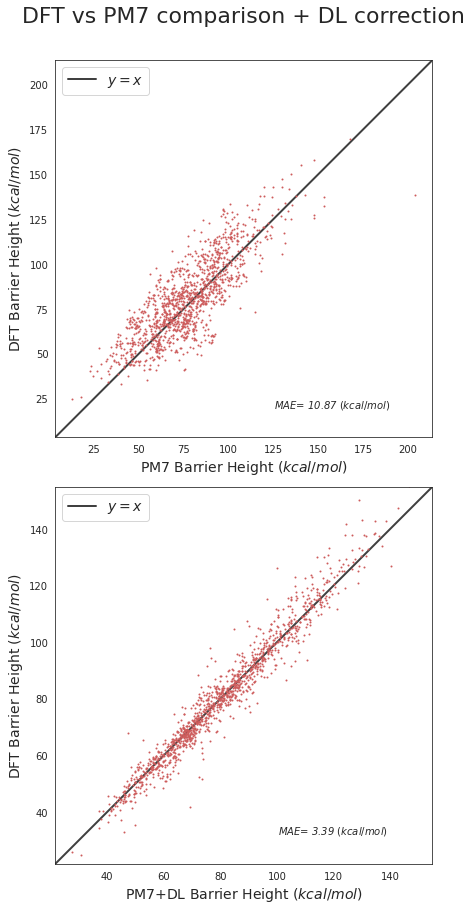

In [ ]:
sns.set_style("white")
plot_df(y_test["ae_diff"].values, X_test["AE_mopac"].values , preds_xg)

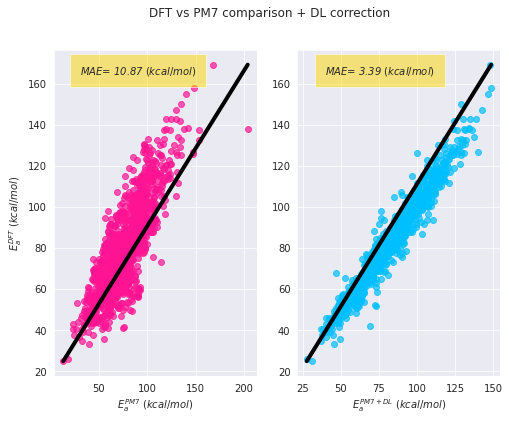

In [ ]:
PlotCorr(y_test["ae_diff"].values , X_test["AE_mopac"].values , preds_xg)


All-NaN slice encountered
All-NaN slice encountered


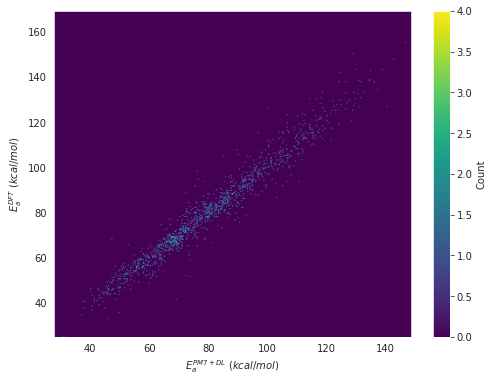

In [ ]:
DensPlot(y_test["ae_diff"].values, X_test["AE_mopac"].values , preds_xg)

### Model interpretability based on SHAP values.

In [ ]:
!pip install shap
import shap


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 569 kB 28.9 MB/s 


In [ ]:
preds_sh = xg_model.predict(X_train , output_margin = True)
explainer = shap.TreeExplainer(xg_model )
sh_values = explainer.shap_values(X_train )

In [ ]:
!pip install rdkit-pypi
#Import rdkit for drawing molecules and gaining more intuitive explanations 
from rdkit import Chem
from rdkit.Chem import Draw
from rdkit.Chem import AllChem

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 22.7 MB 1.5 MB/s 


In [ ]:
smi_df.index.values[np.random.randint(0, smi_df.shape[0] - 1)]

11911

In [ ]:
smi_df.loc[11911]

Rsmiles    [C:1]([C@@:2]1([H:11])[C@@:3]2([H:12])[C:4]([H...
Psmiles    [C:1]([C@@:2]1([H:11])[C@@:3]2([H:12])[C:4]([H...
Name: 11911, dtype: object

In [ ]:
def explainReact(df_smi , sh_values , xtrain , ytrain , labels ):

# place a text box in upper left in axes coords

  idxs = xtrain.index[np.random.randint(0 , xtrain.shape[0] -1 )]
  val_id = np.where(xtrain.index == idxs)[0][0]
  mol_r = df_smi.loc[idxs]["Rsmiles"]
  mol_p = df_smi.loc[idxs]["Psmiles"]

  props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
  fig, ax = plt.subplots()
  mop =  "AE Mopac = " + np.format_float_positional(xtrain["AE_mopac"].values[val_id], precision=2) + "  $kcal/mol$ "
  
  dft =  "AE DFT = " + np.format_float_positional(ytrain.values[val_id] , precision = 2) + "  $kcal/mol$ " 
  ax.text(0.05, 1.15, mop, transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
  ax.text(0.55, 1.15, dft, transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)

  rxn = AllChem.ReactionFromSmarts(mol_r + ">>" + mol_p , useSmiles = True)
  display(Chem.Draw.ReactionToImage(rxn))
  shap.plots._waterfall.waterfall_legacy(explainer.expected_value ,  sh_values[val_id] , feature_names=labels.columns.values )


  return

In [ ]:
from IPython import get_ipython
from IPython.core.magic import register_cell_magic
import PIL
from base64 import b64decode
from io import BytesIO

@register_cell_magic
def capture_png(line, cell):
    get_ipython().run_cell_magic(
        'capture',
        ' --no-stderr --no-stdout result',
        cell
    )
    out_paths = line.strip().split(' ')
    for output in result.outputs:
        data = output.data
        if 'image/png' in data:
            path = out_paths.pop(0)
            if not path:
                raise ValueError('Too few paths given!')
            png_bytes = data['image/png']
            if isinstance(png_bytes, str):
                png_bytes = b64decode(png_bytes)
            assert isinstance(png_bytes, bytes)
            bytes_io = BytesIO(png_bytes)
            image = PIL.Image.open(bytes_io)
            image.save(path, 'png')

In [ ]:
informative_names = {"AE_mopac":r"$BH_{PM7}$" , "exp_mopac":r"$e^{-BH_{PM7}}$" , "Par_n_Pople":r"$\eta^{{TS}}$" , "Mul":r"$\alpha^{{TS}}$" , 
                     "ch_f" : "+CH" , "DH_Mopac":r"$\Delta E_{{r}}$" , "lap_eig_1":r"$\lambda_{{1}}^{{TS}}$" , "Freq":r"$\omega_{{1}}^{{TS}}$" , 
                     "ZPE_TS_P":r"$ZPE^{{TS}} - ZPE^{{P}}$" , "SMR_VSA9":r"$RDKIT_{{1}}$" , "LabuteASA":r"$RDKIT_{{2}}$" , "BalabanJ":r"$RDKIT_{{3}}$" , 
                     "ZPE_TS_R":r"$ZPE^{{TS}} - ZPE^{{R}}$" , "ZPE_P_R":r"$ZPE^{{P}} - ZPE^{{R}}$" , "ch_b": "-CH" , "co_f":"+CO" , "MolLogP":r"$RDKIT_{{4}}$" , 
                     "Chi0v": r"$RDKIT_{{5}}$" , "piS_P_R":r"$\pi^{{S}}_{{P}} - \pi^{{S}}_{{R}}$" , "VSA_EState2":r"$RDKIT_{{6}}$" , "hh_f"  : "+HH"}

In [ ]:
label_Xtrain = X_train.rename(columns = informative_names)

In [ ]:
%%capture_png example_reac.png reac.png
explainReact(smi_df , sh_values , X_train , y_train_xg , label_Xtrain)

In [ ]:
import sys
from PIL import Image
images = [Image.open(x) for x in ['example_reac.png' , 'reac.png']]
widths, heights = zip(*(i.size for i in images))

total_width = max(widths)
max_height = sum(heights)

new_im = Image.new('RGB', (total_width, max_height) , color=(255,255,255,0))

x_offset = 0
z_offset = 0
for im in images:
  new_im.paste(im, (z_offset , x_offset))
  x_offset += im.size[1]
  z_offset += int(im.size[1]/3)+10
new_im.save('final_reac.png')

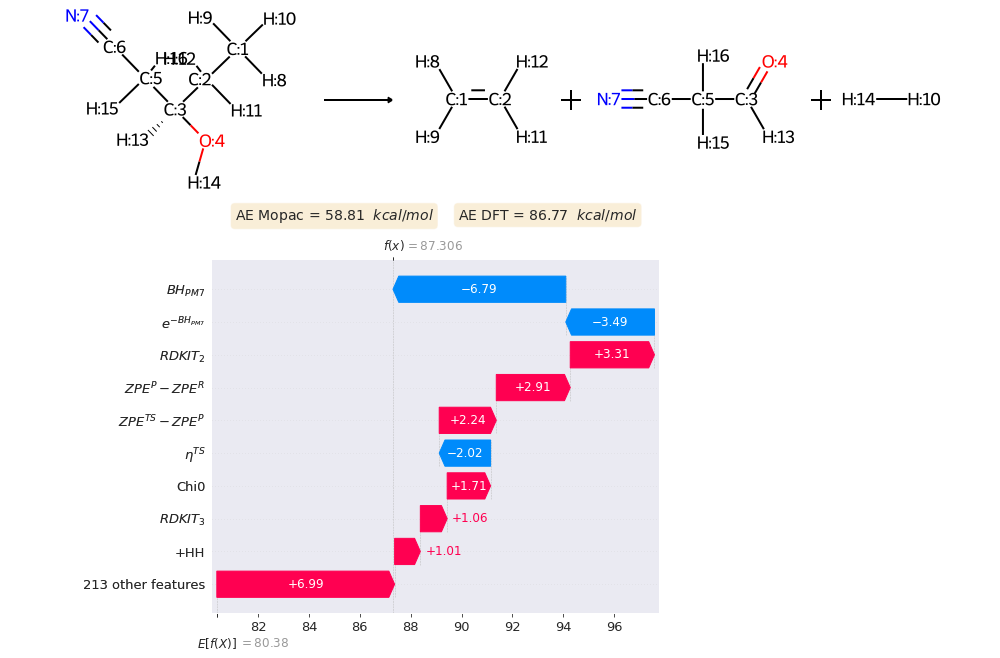

In [ ]:
display(new_im)

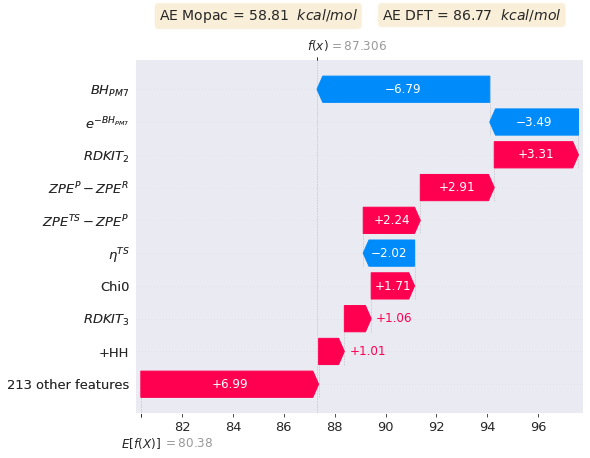

In [ ]:
from IPython.display import Image
from pandas import Series

display(Image('reac.png'))

## Explained predictions for two reactions:


In [ ]:
#SMILES corresponding to reactant on reaction 1000
mol_r = '[O:1]=[C:2]([N:3]([C:4]1([H:9])[C:5]([H:10])([H:11])[C:6]1([H:12])[H:13])[H:8])[H:7]'

#SMILES corresponding to product on reaction 1000
mol_p = '[O:1](/[C:2](=[N:3]\\[H:8])[H:7])[C:6]([C:4](=[C:5]([H:10])[H:11])[H:9])([H:12])[H:13]'


mols = [mol_r , mol_p]

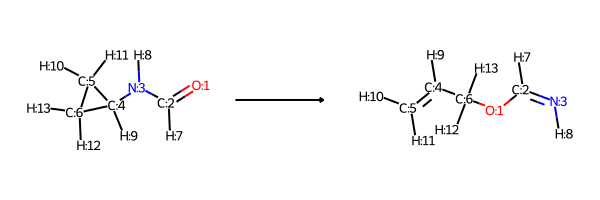

In [ ]:
rxn = AllChem.ReactionFromSmarts(mol_r + ">>" + mol_p , useSmiles = True)
display(Chem.Draw.ReactionToImage(rxn))

In [ ]:
label_Xtrain.columns

Index(['MaxEStateIndex', 'MinEStateIndex', 'MinAbsEStateIndex', 'qed',
       'NumValenceElectrons', 'FpDensityMorgan1', 'FpDensityMorgan2',
       '$RDKIT_{{3}}$', 'BertzCT', 'Chi0',
       ...
       'piS_TS_P', '$\pi^{{S}}_{{P}} - \pi^{{S}}_{{R}}$', 'Mul_TS_R',
       'Mul_TS_P', 'Mul_P_R', 'Par_n_Pople_TS_R', 'Par_n_Pople_TS_P',
       '$\Delta E_{{r}}$', '$BH_{PM7}$', '$e^{-BH_{PM7}}$'],
      dtype='object', length=222)

E[f(X)] is the average of activation energies values in the training set, and f(x) is the prediction of the model. Every row contains a value for the contribution per descriptor, shifting the base value.


In [ ]:
#SMILES corresponding to reactant on reaction 10237
mol_r ='[C:1]([C@@:2]1([H:10])[N:3]([H:11])[C:4]([H:12])([H:13])[C:5]1=[O:6])([H:7])([H:8])[H:9]'
#SMILES corresponding to product on reaction 10237
mol_p = '[C:1]([C+:2]1[N:3]([H:11])[C:4]([H:12])=[C:5]1[O-:6])([H:7])([H:8])[H:9].[H:10][H:13]'


mols = [mol_r , mol_p]

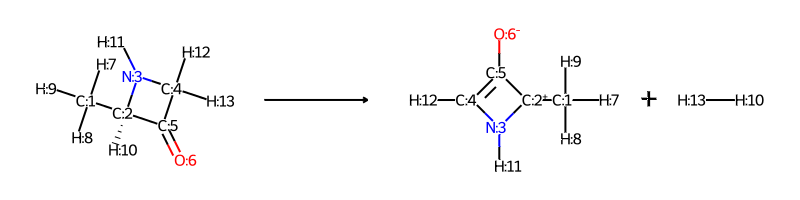

In [ ]:
rxn = AllChem.ReactionFromSmarts(mol_r + ">>" + mol_p , useSmiles = True)
display(Chem.Draw.ReactionToImage(rxn))

In [ ]:
print("DFT -> " , y_train_xg.values[6350])
print("MOPAC -> " , X_train["AE_mopac"].values[6350])

DFT ->  84.03595585237291
MOPAC ->  80.44973


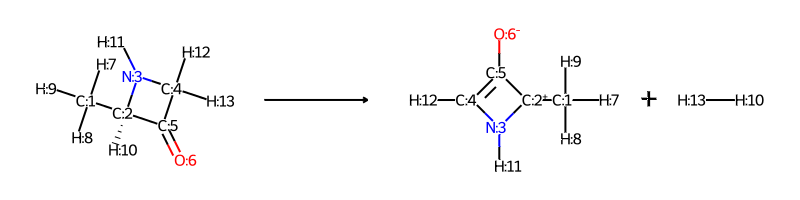

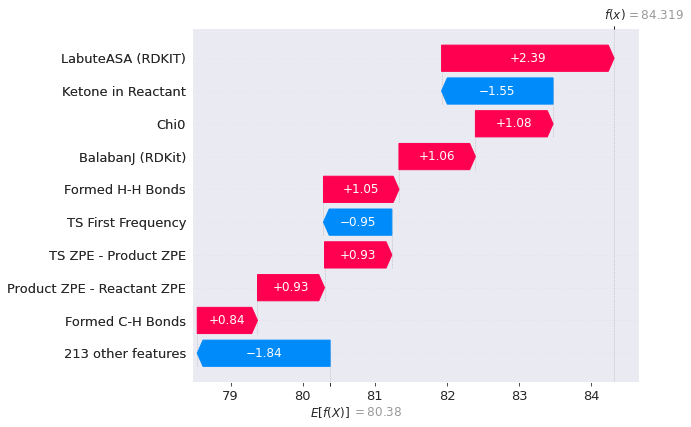

In [ ]:
rxn = AllChem.ReactionFromSmarts(mol_r + ">>" + mol_p , useSmiles = True)
display(Chem.Draw.ReactionToImage(rxn))
shap.plots._waterfall.waterfall_legacy(explainer.expected_value ,  sh_values[6350] , feature_names=label_Xtrain.columns.values)

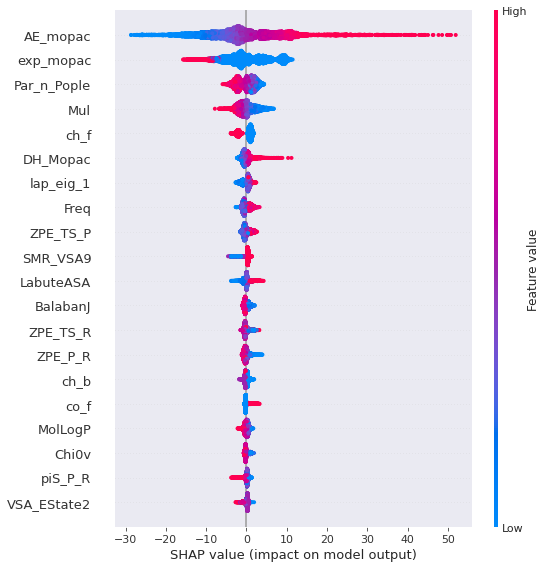

In [ ]:
shap.summary_plot(sh_values , X_train)

In [ ]:
duplicate_columns = label_Xtrain.columns[label_Xtrain.columns.duplicated()]
duplicate_columns

Index([], dtype='object')

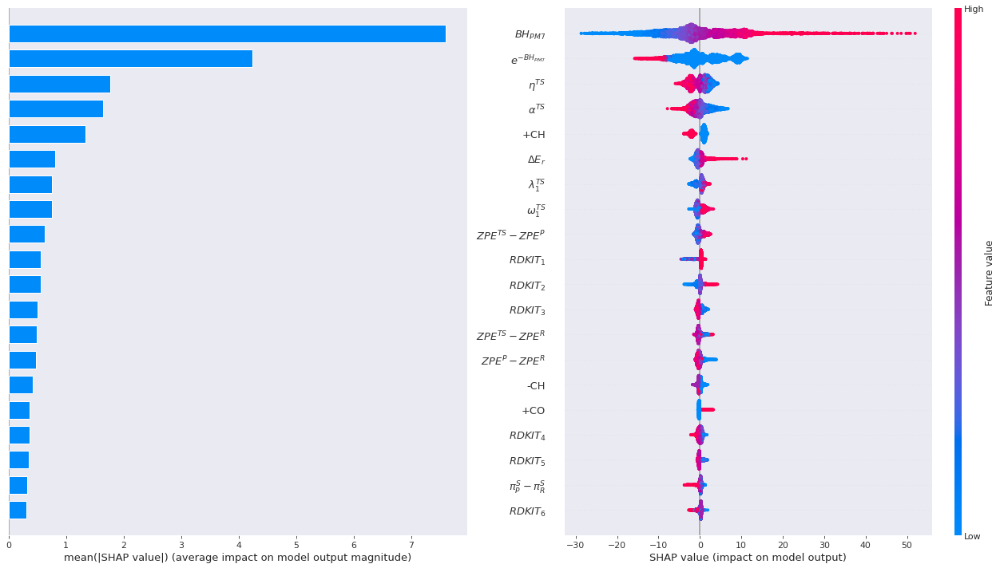

In [ ]:
plt.figure(figsize=(18,10))
plt.subplot(1,2,1)
shap.summary_plot(sh_values , label_Xtrain , plot_type = "bar" , show=False , feature_names=["" for m in ft_names] , plot_size=None)
plt.subplot(1,2,2)
shap.summary_plot(sh_values , label_Xtrain , show = False  , feature_names=ft_names , plot_size=None)
plt.tight_layout()
plt.savefig("shap_concat.pdf")

In [ ]:
ft_names = label_Xtrain.columns.values

In [ ]:
shap.summary_plot(sh_values , label_Xtrain , plot_type = "bar" , show=False)
plt.savefig("shap_importance_abs.pdf")